In [208]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import sklearn
import seaborn as sns
import re

In [209]:
import nltk

In [210]:
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.corpus import stopwords

In [211]:
lemma_lyrics = pd.read_csv('proc_lyrics.csv')

In [212]:
lemma_lyrics.head()

,Unnamed: 0,Rank,Song,Artist,Year,Lyrics,Length,lyrics_tokens,lyrics_lemma,lyrics_pos
0,0,1,wooly bully,sam the sham and the pharaohs,1965,sam the sham miscellaneous wooly bully wooly b...,662,"['sam', 'the', 'sham', 'miscellaneous', 'wooly...","['sam', 'the', 'sham', 'miscellaneous', 'wooly...","['PROPN', 'DET', 'ADJ', 'ADJ', 'PROPN', 'PROPN..."
1,1,2,i cant help myself sugar pie honey bunch,four tops,1965,sugar pie honey bunch you know that i love yo...,995,"[' ', 'sugar', 'pie', 'honey', 'bunch', 'you',...","[' ', 'sugar', 'pie', 'honey', 'bunch', '-PRON...","['SPACE', 'PROPN', 'PROPN', 'PROPN', 'NOUN', '..."
2,2,3,i cant get no satisfaction,the rolling stones,1965,,2,[' '],[' '],['SPACE']
3,3,4,you were on my mind,we five,1965,when i woke up this morning you were on my mi...,692,"[' ', 'when', 'i', 'woke', 'up', 'this', 'morn...","[' ', 'when', 'i', 'wake', 'up', 'this', 'morn...","['SPACE', 'ADV', 'PRON', 'VERB', 'ADP', 'DET',..."
4,4,5,youve lost that lovin feelin,the righteous brothers,1965,you never close your eyes anymore when i kiss...,1173,"[' ', 'you', 'never', 'close', 'your', 'eyes',...","[' ', '-PRON-', 'never', 'close', '-PRON-', 'e...","['SPACE', 'PRON', 'ADV', 'VERB', 'PRON', 'NOUN..."


In [213]:
lemma_lyrics.drop(lemma_lyrics.columns[0], axis=1)

,Rank,Song,Artist,Year,Lyrics,Length,lyrics_tokens,lyrics_lemma,lyrics_pos
0,1,wooly bully,sam the sham and the pharaohs,1965,sam the sham miscellaneous wooly bully wooly b...,662,"['sam', 'the', 'sham', 'miscellaneous', 'wooly...","['sam', 'the', 'sham', 'miscellaneous', 'wooly...","['PROPN', 'DET', 'ADJ', 'ADJ', 'PROPN', 'PROPN..."
1,2,i cant help myself sugar pie honey bunch,four tops,1965,sugar pie honey bunch you know that i love yo...,995,"[' ', 'sugar', 'pie', 'honey', 'bunch', 'you',...","[' ', 'sugar', 'pie', 'honey', 'bunch', '-PRON...","['SPACE', 'PROPN', 'PROPN', 'PROPN', 'NOUN', '..."
2,3,i cant get no satisfaction,the rolling stones,1965,,2,[' '],[' '],['SPACE']
3,4,you were on my mind,we five,1965,when i woke up this morning you were on my mi...,692,"[' ', 'when', 'i', 'woke', 'up', 'this', 'morn...","[' ', 'when', 'i', 'wake', 'up', 'this', 'morn...","['SPACE', 'ADV', 'PRON', 'VERB', 'ADP', 'DET',..."
4,5,youve lost that lovin feelin,the righteous brothers,1965,you never close your eyes anymore when i kiss...,1173,"[' ', 'you', 'never', 'close', 'your', 'eyes',...","[' ', '-PRON-', 'never', 'close', '-PRON-', 'e...","['SPACE', 'PRON', 'ADV', 'VERB', 'PRON', 'NOUN..."
5,6,downtown,petula clark,1965,when youre alone and life is making you lonel...,1333,"[' ', 'when', 'you', 're', 'alone', 'and', 'li...","[' ', 'when', '-PRON-', 'be', 'alone', 'and', ...","['SPACE', 'ADV', 'PRON', 'VERB', 'ADJ', 'CCONJ..."
6,7,help,the beatles,1965,help i need somebody help not just anybody hel...,1089,"['help', 'i', 'need', 'somebody', 'help', 'not...","['help', 'i', 'need', 'somebody', 'help', 'not...","['NOUN', 'PRON', 'VERB', 'PRON', 'VERB', 'PART..."
7,8,cant you hear my heart beat,hermans hermits,1965,carterlewis every time i see you lookin my way...,1052,"['carterlewis', 'every', 'time', 'i', 'see', '...","['carterlewis', 'every', 'time', 'i', 'see', '...","['PROPN', 'DET', 'NOUN', 'PRON', 'VERB', 'PRON..."
8,9,crying in the chapel,elvis presley,1965,you saw me crying in the chapel the tears i s...,738,"[' ', 'you', 'saw', 'me', 'crying', 'in', 'the...","[' ', '-PRON-', 'see', '-PRON-', 'cry', 'in', ...","['SPACE', 'PRON', 'VERB', 'PRON', 'VERB', 'ADP..."
9,10,my girl,the temptations,1965,ive got sunshine on a cloudy day when its cold...,680,"['i', 've', 'got', 'sunshine', 'on', 'a', 'clo...","['-PRON-', 'have', 'get', 'sunshine', 'on', 'a...","['PRON', 'VERB', 'VERB', 'NOUN', 'ADP', 'DET',..."


In [718]:
lemma_lyrics.tail(100)

,Unnamed: 0,Rank,Song,Artist,Year,Lyrics,Length,lyrics_tokens,lyrics_lemma,lyrics_pos
4812,4997,99,somethin bad,miranda lambert and carrie underwood,2014,stand on the bar stomp your feet get clapping...,1715,"[' ', 'stand', 'on', 'the', 'bar', 'stomp', 'y...","[' ', 'stand', 'on', 'the', 'bar', 'stomp', '-...","['SPACE', 'VERB', 'ADP', 'DET', 'NOUN', 'NOUN'..."
4813,4998,100,adore you,miley cyrus,2014,ah hey ah ohbaby baby yeah are you listenin w...,925,"[' ', 'ah', 'hey', 'ah', 'ohbaby', 'baby', 'ye...","[' ', 'ah', 'hey', 'ah', 'ohbaby', 'baby', 'ye...","['SPACE', 'INTJ', 'INTJ', 'INTJ', 'VERB', 'NOU..."
4814,4999,1,uptown funk,mark ronson featuring bruno mars,2015,this hit that ice cold michelle pfeiffer that ...,2829,"['this', 'hit', 'that', 'ice', 'cold', 'michel...","['this', 'hit', 'that', 'ice', 'cold', 'michel...","['DET', 'VERB', 'DET', 'NOUN', 'ADJ', 'PROPN',..."
4815,5000,2,thinking out loud,ed sheeran,2015,when your legs dont work like they used to bef...,1568,"['when', 'your', 'legs', 'do', 'nt', 'work', '...","['when', '-PRON-', 'leg', 'do', 'not', 'work',...","['ADV', 'PRON', 'NOUN', 'AUX', 'PART', 'VERB',..."
4816,5001,3,see you again,wiz khalifa featuring charlie puth,2015,its been a long day without you my friend and ...,2381,"['its', 'been', 'a', 'long', 'day', 'without',...","['-PRON-', 'be', 'a', 'long', 'day', 'without'...","['PRON', 'AUX', 'DET', 'ADJ', 'NOUN', 'ADP', '..."
4817,5002,4,trap queen,fetty wap,2015,im like hey wassup hello seen yo pretty ass so...,2620,"['i', 'm', 'like', 'hey', 'wassup', 'hello', '...","['-PRON-', 'be', 'like', 'hey', 'wassup', 'hel...","['PRON', 'VERB', 'INTJ', 'INTJ', 'PROPN', 'INT..."
4818,5003,5,sugar,maroon 5,2015,im hurting baby im broken down i need your lo...,2151,"[' ', 'i', 'm', 'hurting', 'baby', 'i', 'm', '...","[' ', '-PRON-', 'be', 'hurt', 'baby', '-PRON-'...","['SPACE', 'PRON', 'VERB', 'VERB', 'PROPN', 'PR..."
4819,5004,6,shut up and dance,walk the moon,2015,oh dont you dare look back just keep your eye...,1594,"[' ', 'oh', 'do', 'nt', 'you', 'dare', 'look',...","[' ', 'oh', 'do', 'not', '-PRON-', 'dare', 'lo...","['SPACE', 'INTJ', 'AUX', 'PART', 'PRON', 'VERB..."
4820,5005,7,blank space,taylor swift,2015,nice to meet you where you been i could show ...,2561,"[' ', 'nice', 'to', 'meet', 'you', 'where', 'y...","[' ', 'nice', 'to', 'meet', '-PRON-', 'where',...","['SPACE', 'ADJ', 'PART', 'VERB', 'PRON', 'ADV'..."
4821,5006,8,watch me,silento,2015,now watch me whip kill it now watch me nae na...,1874,"[' ', 'now', 'watch', 'me', 'whip', 'kill', 'i...","[' ', 'now', 'watch', '-PRON-', 'whip', 'kill'...","['SPACE', 'ADV', 'VERB', 'PRON', 'NOUN', 'VERB..."


In [215]:
lemma_lyrics.isnull().sum()

Unnamed: 0       0
Rank             0
Song             0
Artist           0
Year             0
Lyrics           0
Length           0
lyrics_tokens    0
lyrics_lemma     0
lyrics_pos       0
dtype: int64

In [216]:
lemma_lyrics.lyrics_lemma.unique()

array(["['sam', 'the', 'sham', 'miscellaneous', 'wooly', 'bully', 'wooly', 'bully', 'sam', 'the', 'sham', ' ', 'the', 'pharaohs', ' ', 'domingo', 'samudio', 'uno', 'do', 'one', 'two', 'tre', 'quatro', 'matty', 'tell', 'hatty', 'about', 'a', 'thing', '-PRON-', 'see', 'have', 'two', 'big', 'horn', 'and', 'a', 'wooly', 'jaw', 'wooly', 'bully', 'wooly', 'bully', 'wooly', 'bully', 'wooly', 'bully', 'wooly', 'bully', 'hatty', 'tell', 'matty', 'let', 'do', 'not', 'take', 'no', 'chance', 'let', 'not', 'belseven', 'come', 'and', 'learn', 'to', 'dance', 'wooly', 'bully', 'wooly', 'bully', 'wooly', 'bully', 'wooly', 'bully', 'wooly', 'bully', 'matty', 'tell', 'hatty', 'that', 's', 'the', 'thing', 'to', 'do', 'get', '-PRON-', 'someone', 'really', 'to', 'pull', 'the', 'wool', 'with', '-PRON-', 'wooly', 'bully', 'wooly', 'bully', 'wooly', 'bully', 'wooly', 'bully', 'wooly', 'bully', 'lseven', ' ', 'the', 'letter', 'l', 'and', 'the', 'number', '7', 'when', 'type', '-PRON-', 'form', 'a', 'rough', 'squ

In [217]:
from sklearn.feature_extraction.text import CountVectorizer

In [218]:
CountVectorizer().fit(lemma_lyrics['lyrics_lemma'])

CountVectorizer(analyzer='word', binary=False, decode_error='strict',
                dtype=<class 'numpy.int64'>, encoding='utf-8', input='content',
                lowercase=True, max_df=1.0, max_features=None, min_df=1,
                ngram_range=(1, 1), preprocessor=None, stop_words=None,
                strip_accents=None, token_pattern='(?u)\\b\\w\\w+\\b',
                tokenizer=None, vocabulary=None)

In [219]:
count = CountVectorizer()

In [220]:
# lemma_lyrics['lyrics_lemma'] = ["".join(lyric) for lyric in lemma_lyrics['lyrics_lemma'].values]

In [221]:
bag_of_words = count.fit_transform(lemma_lyrics['lyrics_lemma'])

In [222]:
bag_of_words.toarray()

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [223]:
freq = np.ravel(bag_of_words.sum(axis=0))

In [224]:
import operator
# get vocabulary keys, sorted by value
vocab = [v[0] for v in sorted(count.vocabulary_.items(), key=operator.itemgetter(1))]
fdist = dict(zip(vocab, freq)) # return same format as nltk

In [225]:
fdist

{'0120': 1,
 '02': 1,
 '03': 1,
 '04': 1,
 '07': 1,
 '082': 1,
 '10': 27,
 '100': 32,
 '1000': 4,
 '100000': 4,
 '100k': 1,
 '100s': 1,
 '1010': 2,
 '102': 1,
 '104': 7,
 '105': 5,
 '106': 3,
 '109': 1,
 '10slooking': 1,
 '10th': 2,
 '11': 4,
 '110': 1,
 '111123oclock': 1,
 '112': 4,
 '112we': 1,
 '1130': 11,
 '12': 32,
 '120': 1,
 '1205': 1,
 '123': 41,
 '1230': 1,
 '1234': 2,
 '125': 3,
 '129': 1,
 '12move': 1,
 '12string': 1,
 '12yearold': 1,
 '13': 5,
 '13th': 1,
 '14': 10,
 '146': 1,
 '14th': 1,
 '15': 6,
 '15000': 3,
 '151': 1,
 '15th': 1,
 '16': 4,
 '16th': 1,
 '17': 7,
 '1780': 2,
 '17th': 1,
 '18': 30,
 '1800430': 2,
 '183': 1,
 '185': 1,
 '18th': 1,
 '19': 2,
 '1900mixalot': 1,
 '1910': 2,
 '1949': 1,
 '1951': 1,
 '1955': 1,
 '1959': 1,
 '1963': 1,
 '1965': 1,
 '196667': 1,
 '1968': 2,
 '1969': 3,
 '1970': 4,
 '1972': 1,
 '1973': 1,
 '1975': 1,
 '1979': 2,
 '1980': 1,
 '1981': 1,
 '1982': 2,
 '1982and': 1,
 '1984': 1,
 '1985': 1,
 '1989': 2,
 '1991': 2,
 '1992': 1,
 '1994': 2

In [226]:
import collections

In [227]:
from collections import OrderedDict

In [228]:
OrderedDict(sorted(fdist.items(), key=operator.itemgetter(1), reverse=True))

OrderedDict([('pron', 238172),
             ('be', 65070),
             ('the', 53439),
             ('to', 42593),
             ('and', 32556),
             ('not', 29435),
             ('do', 25058),
             ('that', 18956),
             ('in', 18555),
             ('get', 18472),
             ('love', 17210),
             ('on', 15814),
             ('go', 14757),
             ('can', 13565),
             ('of', 12817),
             ('know', 12716),
             ('all', 12519),
             ('have', 11987),
             ('like', 11069),
             ('so', 10545),
             ('for', 10447),
             ('oh', 9737),
             ('just', 9569),
             ('with', 9146),
             ('baby', 9123),
             ('what', 8792),
             ('up', 8749),
             ('but', 8616),
             ('no', 8315),
             ('when', 7919),
             ('will', 7766),
             ('make', 7686),
             ('say', 7592),
             ('this', 7332),
             ('want', 7

In [229]:
OrderedDict(sorted(fdist.items(), key=operator.itemgetter(1), reverse=False))

OrderedDict([('0120', 1),
             ('02', 1),
             ('03', 1),
             ('04', 1),
             ('07', 1),
             ('082', 1),
             ('100k', 1),
             ('100s', 1),
             ('102', 1),
             ('109', 1),
             ('10slooking', 1),
             ('110', 1),
             ('111123oclock', 1),
             ('112we', 1),
             ('120', 1),
             ('1205', 1),
             ('1230', 1),
             ('129', 1),
             ('12move', 1),
             ('12string', 1),
             ('12yearold', 1),
             ('13th', 1),
             ('146', 1),
             ('14th', 1),
             ('151', 1),
             ('15th', 1),
             ('16th', 1),
             ('17th', 1),
             ('183', 1),
             ('185', 1),
             ('18th', 1),
             ('1900mixalot', 1),
             ('1949', 1),
             ('1951', 1),
             ('1955', 1),
             ('1959', 1),
             ('1963', 1),
             ('1965', 1

In [230]:
feature_names = count.get_feature_names()

In [231]:
feature_names

['0120',
 '02',
 '03',
 '04',
 '07',
 '082',
 '10',
 '100',
 '1000',
 '100000',
 '100k',
 '100s',
 '1010',
 '102',
 '104',
 '105',
 '106',
 '109',
 '10slooking',
 '10th',
 '11',
 '110',
 '111123oclock',
 '112',
 '112we',
 '1130',
 '12',
 '120',
 '1205',
 '123',
 '1230',
 '1234',
 '125',
 '129',
 '12move',
 '12string',
 '12yearold',
 '13',
 '13th',
 '14',
 '146',
 '14th',
 '15',
 '15000',
 '151',
 '15th',
 '16',
 '16th',
 '17',
 '1780',
 '17th',
 '18',
 '1800430',
 '183',
 '185',
 '18th',
 '19',
 '1900mixalot',
 '1910',
 '1949',
 '1951',
 '1955',
 '1959',
 '1963',
 '1965',
 '196667',
 '1968',
 '1969',
 '1970',
 '1972',
 '1973',
 '1975',
 '1979',
 '1980',
 '1981',
 '1982',
 '1982and',
 '1984',
 '1985',
 '1989',
 '1991',
 '1992',
 '1994',
 '1999',
 '1breaking',
 '1chorus',
 '1i',
 '1if',
 '1oh',
 '1repeat',
 '1rollercoaster',
 '1st',
 '1when',
 '1you',
 '20',
 '200',
 '2000',
 '2001',
 '2002',
 '2003',
 '2004',
 '2004girl',
 '2004its',
 '2006',
 '2007',
 '2008',
 '2009',
 '2010',
 '2011',

In [232]:
bow_dummies_df = pd.DataFrame(bag_of_words.toarray(), columns=feature_names)

In [233]:
bow_dummies_df.head()

,0120,02,03,04,07,082,10,100,1000,100000,...,zoowap,zound,zs,zsa,zu,zucchinis,zulu,zum,zwei,ìê
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [234]:
all_dummies_df = lemma_lyrics.join(bow_dummies_df)

In [235]:
all_dummies_df.shape

(4912, 37926)

In [236]:
all_dummies_df.describe()

,Unnamed: 0,Rank,Year,Length,0120,02,03,04,07,082,...,zoowap,zound,zs,zsa,zu,zucchinis,zulu,zum,zwei,ìê
count,4912.000000,4912.000000,4912.000000,4912.000000,4912.000000,4912.000000,4912.000000,4912.000000,4912.000000,4912.000000,...,4912.000000,4912.000000,4912.000000,4912.000000,4912.000000,4912.000000,4912.000000,4912.000000,4912.000000,4912.000000
mean,2568.088966,50.440350,1990.195847,1568.194829,0.000204,0.000204,0.000204,0.000204,0.000204,0.000204,...,0.000611,0.000611,0.000407,0.000814,0.000407,0.000204,0.000204,0.000407,0.000204,0.000814
std,1470.520648,28.820238,14.702657,811.688713,0.014268,0.014268,0.014268,0.014268,0.014268,0.014268,...,0.042805,0.042805,0.020176,0.040353,0.020176,0.014268,0.014268,0.028537,0.014268,0.034944
min,0.000000,1.000000,1965.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1305.750000,26.000000,1978.000000,1024.750000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2567.500000,50.500000,1990.000000,1408.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,3841.250000,75.000000,2003.000000,1926.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,5098.000000,100.000000,2015.000000,5758.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,3.000000,3.000000,1.000000,2.000000,1.000000,1.000000,1.000000,2.000000,1.000000,2.000000


In [237]:
all_dummies_df.drop(all_dummies_df.columns[0], inplace=True, axis=1)

In [238]:
all_dummies_df.head()

,Rank,Song,Artist,Year,Lyrics,Length,lyrics_tokens,lyrics_lemma,lyrics_pos,0120,...,zoowap,zound,zs,zsa,zu,zucchinis,zulu,zum,zwei,ìê
0,1,wooly bully,sam the sham and the pharaohs,1965,sam the sham miscellaneous wooly bully wooly b...,662,"['sam', 'the', 'sham', 'miscellaneous', 'wooly...","['sam', 'the', 'sham', 'miscellaneous', 'wooly...","['PROPN', 'DET', 'ADJ', 'ADJ', 'PROPN', 'PROPN...",0,...,0,0,0,0,0,0,0,0,0,0
1,2,i cant help myself sugar pie honey bunch,four tops,1965,sugar pie honey bunch you know that i love yo...,995,"[' ', 'sugar', 'pie', 'honey', 'bunch', 'you',...","[' ', 'sugar', 'pie', 'honey', 'bunch', '-PRON...","['SPACE', 'PROPN', 'PROPN', 'PROPN', 'NOUN', '...",0,...,0,0,0,0,0,0,0,0,0,0
2,3,i cant get no satisfaction,the rolling stones,1965,,2,[' '],[' '],['SPACE'],0,...,0,0,0,0,0,0,0,0,0,0
3,4,you were on my mind,we five,1965,when i woke up this morning you were on my mi...,692,"[' ', 'when', 'i', 'woke', 'up', 'this', 'morn...","[' ', 'when', 'i', 'wake', 'up', 'this', 'morn...","['SPACE', 'ADV', 'PRON', 'VERB', 'ADP', 'DET',...",0,...,0,0,0,0,0,0,0,0,0,0
4,5,youve lost that lovin feelin,the righteous brothers,1965,you never close your eyes anymore when i kiss...,1173,"[' ', 'you', 'never', 'close', 'your', 'eyes',...","[' ', '-PRON-', 'never', 'close', '-PRON-', 'e...","['SPACE', 'PRON', 'ADV', 'VERB', 'PRON', 'NOUN...",0,...,0,0,0,0,0,0,0,0,0,0


In [241]:
all_dummies_df.drop(['Song', 'Artist', 'Lyrics', 'lyrics_tokens', 'lyrics_lemma', 'lyrics_pos'], inplace=True, axis=1)

In [242]:
all_dummies_df.head()

,Rank,Year,Length,0120,02,03,04,07,082,10,...,zoowap,zound,zs,zsa,zu,zucchinis,zulu,zum,zwei,ìê
0,1,1965,662,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2,1965,995,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,3,1965,2,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,1965,692,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,5,1965,1173,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [243]:
lin_df = all_dummies_df

In [96]:
lin_df.to_csv('numbers_only.csv')

In [499]:
lin_df.sum()

Rank             247763
Year            9775842
Length          7702973
0120                  1
02                    1
03                    1
04                    1
07                    1
082                   1
10                   27
100                  32
1000                  4
100000                4
100k                  1
100s                  1
1010                  2
102                   1
104                   7
105                   5
106                   3
109                   1
10slooking            1
10th                  2
11                    4
110                   1
111123oclock          1
112                   4
112we                 1
1130                 11
12                   32
                 ...   
zippa                 1
zippedy               1
zipper                5
ziti                  1
zodiac                1
zombie                5
zone                 98
zonecheck             1
zoneheadin            1
zonehighway           2
zonemove        

In [600]:
skinny_df = lin_df[lin_df.columns[lin_df.sum()>10]]

In [611]:
skinny_df.head()

,Rank,Length,10,100,1130,12,123,18,20,2015,...,youyou,youyoure,yoyo,yuh,yummy,yup,zero,zone,zoomin,year_bins
0,1,662,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,"(1964, 1975]"
1,2,995,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,"(1964, 1975]"
2,3,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,"(1964, 1975]"
3,4,692,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,"(1964, 1975]"
4,5,1173,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,"(1964, 1975]"


In [651]:
skinny_df.drop(['pron', 'the', 'to', 'be', 'and', 'not, 'do', 'that', 'in', 'get'], inplace=True, axis=1)
             

SyntaxError: invalid syntax (<ipython-input-651-3451ddffb1a3>, line 1)

In [654]:
skinny_df.drop(['pron', 'the', 'to', 'be', 'and', 'not', 'do', 'that', 'in', 'get'], inplace=True, axis=1)

In [656]:
skinny_df.head()

,Rank,Length,10,100,1130,12,123,18,20,2015,...,youyou,youyoure,yoyo,yuh,yummy,yup,zero,zone,zoomin,decade
0,1,662,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2,995,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,3,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,692,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,5,1173,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [363]:
from sklearn.linear_model import LinearRegression

In [364]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(X,y,test_size=.2,random_state=33)

In [365]:
# X = skinny_df.drop('Rank', axis=1)
# y = skinny_df['Rank']

In [366]:
# X.array.reshape(-1, 1)

In [367]:
skinny_linmodel = LinearRegression()

In [368]:
skinny_linmodel.fit(x_test,y_test)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [369]:
skinny_linmodel.fit(x_train,y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [370]:
# linmodel.score(y_train, y_pred)

In [371]:
y_pred = skinny_linmodel.predict(x_test)

In [372]:
y_test.shape

(983,)

In [373]:
y_pred.shape

(983,)

In [374]:
skinny_linmodel.score(x_test, y_test)

-2.406794770993499e+16

In [375]:
skinny_linmodel.score(x_train, y_train)

0.9541869159962612

In [376]:
X.head()

,Year,Length,10,100,104,1130,12,123,14,15,...,yummy,yup,zee,zero,zip,zone,zono,zoo,zoom,zoomin
0,1965,662,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1965,995,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1965,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1965,692,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1965,1173,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [377]:
y.head()

0    1
1    2
2    3
3    4
4    5
Name: Rank, dtype: int64

In [378]:
y_pred = skinny_linmodel.predict(x_train)

In [379]:
y_pred_test = skinny_linmodel.predict(x_test)

In [380]:
from sklearn import metrics

In [381]:
import numpy as np

In [382]:
import statsmodels.api as sm

In [383]:
np.sqrt(metrics.mean_squared_error(y_test,y_pred_test))

4529002511.074187

In [384]:
np.sqrt(metrics.mean_squared_error(y_train,y_pred))

6.147662284552753

In [385]:
dftest = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred_test})
dftest1 = dftest.head(25)

In [386]:
dftest1

,Actual,Predicted
2611,30,-1.887228e+09
3367,23,7.910337e+01
1312,96,-9.679181e+08
2974,5,-4.323776e+09
4556,39,2.385236e+09
3287,41,-1.114327e+09
2497,13,-1.858577e+09
4709,94,6.234779e+09
418,41,1.918767e+09
3049,89,-2.388591e+09


In [387]:
df = pd.DataFrame({'Actual': y_train, 'Predicted': y_pred})
df1 = df.head(25)

In [388]:
df1

,Actual,Predicted
3695,56,55.999566
3420,76,75.999138
113,20,19.999740
3838,2,1.999603
2865,93,92.997633
3676,35,34.999705
3303,58,57.999495
4019,88,70.050865
975,38,37.999697
4510,92,91.999362


In [395]:
coeff_df = pd.DataFrame(skinny_linmodel.coef_, X.columns, columns=['Coefficient'])  


In [396]:
test = coeff_df.sort_values(['Coefficient'], ascending=[1])

In [397]:
test.values

array([[-1.05298810e+10],
       [-9.10340020e+09],
       [-8.93148419e+09],
       ...,
       [ 1.27441593e+10],
       [ 1.40424454e+10],
       [ 1.66629900e+10]])

In [398]:
from sklearn.linear_model import Lasso

In [399]:

lasso = Lasso()
lasso.fit(x_train,y_train)
train_score=lasso.score(x_train,y_train)
test_score=lasso.score(x_test,y_test)
coeff_used = np.sum(lasso.coef_!=0)
print("training score:", train_score)
print ("test score:", test_score)
print("number of features used: ", coeff_used)


training score: 0.02772291951075256
test score: 0.000880947476082472
number of features used:  71


In [609]:
# skinny_df = skinny_df[skinny_df.columns[skinny_df.sum()<18000]]

In [612]:
# skinny_df['year_bins'] = pd.cut(x=skinny_df["Year"], bins=[1964, 1975, 1985, 1995, 2005, 2016])

In [613]:
skinny_df.tail()

,Rank,Length,10,100,1130,12,123,18,20,2015,...,youyou,youyoure,yoyo,yuh,yummy,yup,zero,zone,zoomin,year_bins
4907,95,684,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,"(2005, 2016]"
4908,96,1805,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,"(2005, 2016]"
4909,98,1601,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,"(2005, 2016]"
4910,99,2458,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,"(2005, 2016]"
4911,100,1691,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,"(2005, 2016]"


In [604]:
skinny_df = skinny_df.drop('Year', 1)

In [657]:
skinny_df.head()

,Rank,Length,10,100,1130,12,123,18,20,2015,...,youyou,youyoure,yoyo,yuh,yummy,yup,zero,zone,zoomin,decade
0,1,662,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2,995,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,3,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,692,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,5,1173,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [658]:
from sklearn.preprocessing import LabelEncoder

In [659]:
le = LabelEncoder()

In [661]:
# skinny_df['decade'] = le.fit_transform(skinny_df['year_bins'])

In [618]:
list(le.classes_)

[Interval(1964, 1975, closed='right'),
 Interval(1975, 1985, closed='right'),
 Interval(1985, 1995, closed='right'),
 Interval(1995, 2005, closed='right'),
 Interval(2005, 2016, closed='right')]

In [662]:
skinny_df.tail()

,Rank,Length,10,100,1130,12,123,18,20,2015,...,youyou,youyoure,yoyo,yuh,yummy,yup,zero,zone,zoomin,decade
4907,95,684,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,4
4908,96,1805,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,4
4909,98,1601,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,4
4910,99,2458,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,4
4911,100,1691,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,4


In [521]:
skinny_df = skinny_df.drop('x', 1)

In [620]:
skinny_df = skinny_df.drop('year_bins', 1)

In [622]:
skinny_df.head()

,Rank,Length,10,100,1130,12,123,18,20,2015,...,youyou,youyoure,yoyo,yuh,yummy,yup,zero,zone,zoomin,decade
0,1,662,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2,995,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,3,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,692,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,5,1173,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [663]:
X = skinny_df.drop(['decade'],axis=1)
y = skinny_df['decade']

In [664]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=101)

In [665]:
X_train.shape

(3929, 4254)

In [666]:
y_train.shape

(3929,)

In [700]:
from sklearn.naive_bayes import MultinomialNB
clf = MultinomialNB()
clf.fit(X, y)
MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)

print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.3672431332655137


In [668]:
categories = [0, 1, 2, 3, 4]

In [669]:
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score
from sklearn.multiclass import OneVsRestClassifier
# Using pipeline for applying logistic regression and one vs rest classifier
LogReg_pipeline = Pipeline([
                ('clf', OneVsRestClassifier(LogisticRegression(solver='sag'), n_jobs=-1)),
            ])
for category in categories:
    print('**Processing {} comments...**'.format(category))
    
    # Training logistic regression model on train data
    LogReg_pipeline.fit(x_train, y_train)
    
    # calculating test accuracy
    prediction = LogReg_pipeline.predict(x_test)
    print('Test accuracy is {}'.format(accuracy_score(y_test, prediction)))
    print("\n")

**Processing 0 comments...**
Test accuracy is 0.20549338758901323


**Processing 1 comments...**
Test accuracy is 0.20549338758901323


**Processing 2 comments...**
Test accuracy is 0.20549338758901323


**Processing 3 comments...**
Test accuracy is 0.20752797558494404


**Processing 4 comments...**
Test accuracy is 0.20447609359104782




In [670]:
from sklearn.tree import DecisionTreeClassifier 
from sklearn.metrics import accuracy_score, roc_curve, auc
from sklearn import tree 
from IPython.display import Image  
from sklearn.tree import export_graphviz

In [671]:
clf = DecisionTreeClassifier(random_state=101)

clf.fit(X_train,y_train)
y_pred = clf.predict(X_test)

In [672]:
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.3672431332655137


In [673]:
from sklearn.metrics import confusion_matrix

In [674]:
from sklearn.metrics import classification_report

In [675]:

print(confusion_matrix(y_test, pred))
print(classification_report(y_test, y_pred))

[[79 58 37 20 16]
 [46 54 40 22 18]
 [33 32 57 50 34]
 [18 24 40 79 44]
 [11 21 29 41 80]]
              precision    recall  f1-score   support

           0       0.42      0.39      0.40       210
           1       0.28      0.28      0.28       180
           2       0.28      0.31      0.29       206
           3       0.41      0.38      0.39       205
           4       0.46      0.48      0.47       182

    accuracy                           0.37       983
   macro avg       0.37      0.37      0.37       983
weighted avg       0.37      0.37      0.37       983



In [676]:
print("Testing Accuracy for Decision Tree Classifier: {:.4}%".format(accuracy_score(y_test, pred) * 100))

Testing Accuracy for Decision Tree Classifier: 35.5%


In [677]:
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier

In [678]:
bagged_tree = BaggingClassifier(DecisionTreeClassifier(criterion='gini', max_depth=5), n_estimators=20)

In [679]:
bagged_tree.fit(X_train, y_train)

BaggingClassifier(base_estimator=DecisionTreeClassifier(class_weight=None,
                                                        criterion='gini',
                                                        max_depth=5,
                                                        max_features=None,
                                                        max_leaf_nodes=None,
                                                        min_impurity_decrease=0.0,
                                                        min_impurity_split=None,
                                                        min_samples_leaf=1,
                                                        min_samples_split=2,
                                                        min_weight_fraction_leaf=0.0,
                                                        presort=False,
                                                        random_state=None,
                                                        splitter='best'),
       

In [680]:
bagged_tree.score(X_train, y_train)

0.5026724357342836

In [681]:
bagged_tree.score(X_test, y_test)

0.3916581892166836

In [708]:
forest = RandomForestClassifier(bootstrap=True, class_weight=None, criterion='entropy',
                       max_depth=40, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=3, min_samples_split=3,
                       min_weight_fraction_leaf=0.0, n_estimators=400,
                       n_jobs=None, oob_score=False, random_state=33, verbose=0,
                       warm_start=False)
    
forest.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='entropy',
                       max_depth=40, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=3, min_samples_split=3,
                       min_weight_fraction_leaf=0.0, n_estimators=400,
                       n_jobs=None, oob_score=False, random_state=33, verbose=0,
                       warm_start=False)

In [709]:
forest.score(X_train, y_train)

0.9577500636294223

In [710]:
forest.score(X_test, y_test)

0.4659206510681587

In [713]:
y_pred = forest.predict(X_test)

In [714]:
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

cnf_matrix = confusion_matrix(y_test, y_pred)
print('Confusion Matrix:\n',cnf_matrix)

[[169  18  12   2   9]
 [ 91  48  26   7   8]
 [ 55  42  60  21  28]
 [ 31  11  19  43 101]
 [ 15  10  11   8 138]]
              precision    recall  f1-score   support

           0       0.47      0.80      0.59       210
           1       0.37      0.27      0.31       180
           2       0.47      0.29      0.36       206
           3       0.53      0.21      0.30       205
           4       0.49      0.76      0.59       182

    accuracy                           0.47       983
   macro avg       0.47      0.47      0.43       983
weighted avg       0.47      0.47      0.43       983



In [715]:
cnf_matrix = confusion_matrix(y_test, y_pred)
print('Confusion Matrix:\n',cnf_matrix)

Confusion Matrix:
 [[169  18  12   2   9]
 [ 91  48  26   7   8]
 [ 55  42  60  21  28]
 [ 31  11  19  43 101]
 [ 15  10  11   8 138]]


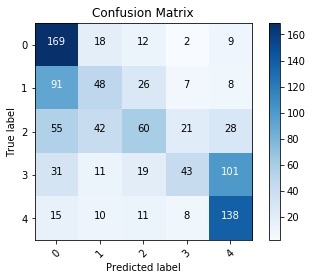

In [716]:
import numpy as np
import itertools
import matplotlib.pyplot as plt
%matplotlib inline

plt.imshow(cnf_matrix,  cmap=plt.cm.Blues) #Create the basic matrix.

#Add title and Axis Labels
plt.title('Confusion Matrix')
plt.ylabel('True label')
plt.xlabel('Predicted label')

#Add appropriate Axis Scales
class_names = set(y) #Get class labels to add to matrix
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names, rotation=45)
plt.yticks(tick_marks, class_names)

#Add Labels to Each Cell
thresh = cnf_matrix.max() / 2. #Used for text coloring below
#Here we iterate through the confusion matrix and append labels to our visualization.
for i, j in itertools.product(range(cnf_matrix.shape[0]), range(cnf_matrix.shape[1])):
        plt.text(j, i, cnf_matrix[i, j],
                 horizontalalignment="center",
                 color="white" if cnf_matrix[i, j] > thresh else "black")

#Add a Side Bar Legend Showing Colors
plt.colorbar()

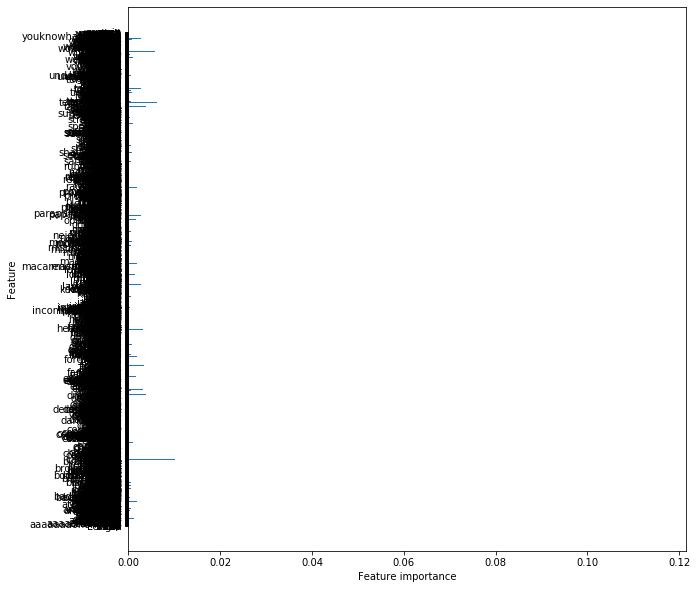

In [685]:
def plot_feature_importances(model):
    n_features = X_train.shape[1]
    plt.figure(figsize=(10,10))
    plt.barh(range(n_features), model.feature_importances_, align='center') 
    plt.yticks(np.arange(n_features), X_train.columns.values) 
    plt.xlabel("Feature importance")
    plt.ylabel("Feature")

plot_feature_importances(clf)

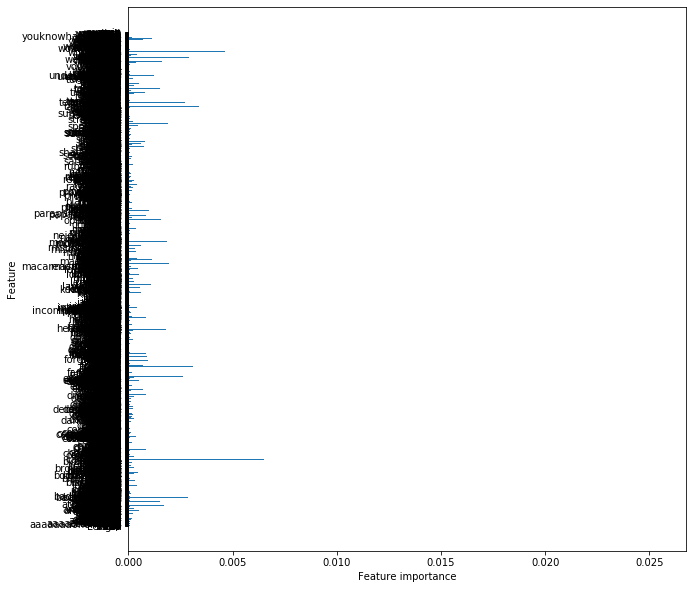

In [686]:
plot_feature_importances(forest)

In [687]:
forest_2 = RandomForestClassifier(random_state=33)
forest_2.fit(X_train, y_train)

//anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=33, verbose=0,
                       warm_start=False)

In [688]:
forest_2.score(X_train, y_train)

0.9890557393738865

In [689]:
from sklearn.model_selection import GridSearchCV

In [706]:
forest = RandomForestClassifier()

rf_param_grid = {
    'n_estimators': [500],
    'criterion': ['entropy'],
    'max_depth': [35],
    'min_samples_split': [3, 6],
    'min_samples_leaf': [3, 6]
}

gs_rf = GridSearchCV(forest, rf_param_grid, cv=4)
gs_rf.fit(X_train, y_train)

gs_rf.best_params_
print(f'Testing Accuracy: {gs_rf.best_score_ :.2%}')


Testing Accuracy: 46.70%


In [696]:
import time
start = time.time()
rf_grid_search = GridSearchCV(forest, rf_param_grid, cv=4)
rf_grid_search.fit(X_train, y_train)

print(f"Testing Accuracy: {rf_grid_search.best_score_ :.2%}")
print(f"Total Runtime for Grid Search on Random Forest Classifier: {time.time() - start :.2f} seconds")
print("")
print(f"Optimal Parameters: {rf_grid_search.best_params_}")

Testing Accuracy: 46.42%
Total Runtime for Grid Search on Random Forest Classifier: 1407.63 seconds

Optimal Parameters: {'criterion': 'entropy', 'max_depth': 25, 'min_samples_leaf': 3, 'min_samples_split': 3, 'n_estimators': 200}


In [721]:
forest.fit(X_test, y_test)
# Extract single tree
estimator = forest.estimators_[5]

In [731]:
from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree.dot',
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')